<a href="https://colab.research.google.com/github/jacquelinepalumbo/Sprint2_MVP/blob/master/ML_Penguins_vs_Turts_Object_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

 **Classificador de imagens binária - Pinguins VS Tartarugas**

Temos um conjunto de imagens que representam duas categorias de animais: pinguins e tartarugas. O objetivo deste notebook é criar um modelo de visão computacional que consiga classificar uma imagem em alguma das categorias mencionadas acima.

# Importando as bibliotecas necessárias para executar o notebook

In [81]:
import tensorflow as tf
import tensorflow_hub as hub
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tempfile
from six.moves.urllib.request import urlopen
from six import BytesIO
import numpy as np
import pandas as pd
import PIL
from PIL import Image
from PIL import ImageColor
from PIL import ImageDraw
from PIL import ImageFont
from PIL import ImageOps
import time
import os
import urllib.request
from IPython.display import Image
from sklearn.model_selection import train_test_split
import shutil
import random
import math
from keras.preprocessing.image import ImageDataGenerator
from keras import layers
from keras import models
from keras import optimizers
from tensorflow.keras.preprocessing import image
from sklearn.metrics import confusion_matrix, classification_report
import os
import zipfile
import matplotlib.image as mpimg
import matplotlib.pyplot as plt
from datetime import datetime
from tensorflow import keras
import sklearn.metrics as skm
import itertools

# Print Tensorflow version
print(tf.__version__)

# Check available GPU devices.
print("The following GPU devices are available: %s" % tf.test.gpu_device_name())

2.12.0
The following GPU devices are available: 


# Importando os datasets

Sobre o conjunto de dados 572 imagens únicas, divididas em uma pasta de treinamento de 500 imagens e uma pasta de validação de 72 imagens. O conjunto de dados é dividido 50:50 entre imagens de tartarugas e pinguins. Cada imagem contém exatamente uma instância de um objeto. As informações de anotação que acompanham a lista são apresentadas por dicionários. Os IDs de categoria incluem 1 (pinguim) e 2 (tartaruga).

In [82]:
# Carregando dataset de treino
train_model = pd.read_json("https://raw.githubusercontent.com/jacquelinepalumbo/Sprint2_MVP/master/train_annotations")
train_model.head()

,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,1,"[119, 25, 205, 606]",124230,[],0
1,1,1,1,"[131, 82, 327, 440]",143880,[],0
2,2,2,2,"[225, 298, 198, 185]",36630,[],0
3,3,3,2,"[468, 109, 172, 193]",33196,[],0
4,4,4,1,"[14, 242, 611, 154]",94094,[],0


In [83]:
# Carregando dataset de validação
valid_model = pd.read_json("https://raw.githubusercontent.com/jacquelinepalumbo/Sprint2_MVP/master/valid_annotations")
valid_model.head()

,id,image_id,category_id,bbox,area,segmentation,iscrowd
0,0,0,1,"[227, 93, 298, 525]",156450,[],0
1,1,1,2,"[211, 198, 428, 259]",110852,[],0
2,2,2,2,"[0, 243, 512, 267]",136704,[],0
3,3,3,1,"[128, 178, 457, 354]",161778,[],0
4,4,4,1,"[168, 131, 296, 469]",138824,[],0


In [84]:
# Importando Google Drive
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [85]:
# importando pasta de imagens treino
train_image= '/content/drive/MyDrive/MLPenguins_Turts/train/train'

In [86]:
# Exibindo quantidade de imagens
print(f"Temos um total de {len(os.listdir(train_image))} imagens para a treinamento do modelo")

Temos um total de 500 imagens para a treinamento do modelo


In [87]:
# Exibindo as imagens para a validação
os.listdir(train_image)

['image_id_006.jpg',
 'image_id_010.jpg',
 'image_id_021.jpg',
 'image_id_018.jpg',
 'image_id_001.jpg',
 'image_id_026.jpg',
 'image_id_016.jpg',
 'image_id_028.jpg',
 'image_id_005.jpg',
 'image_id_011.jpg',
 'image_id_004.jpg',
 'image_id_012.jpg',
 'image_id_024.jpg',
 'image_id_014.jpg',
 'image_id_023.jpg',
 'image_id_013.jpg',
 'image_id_017.jpg',
 'image_id_025.jpg',
 'image_id_000.jpg',
 'image_id_029.jpg',
 'image_id_003.jpg',
 'image_id_007.jpg',
 'image_id_020.jpg',
 'image_id_015.jpg',
 'image_id_008.jpg',
 'image_id_027.jpg',
 'image_id_002.jpg',
 'image_id_009.jpg',
 'image_id_022.jpg',
 'image_id_019.jpg',
 'image_id_058.jpg',
 'image_id_072.jpg',
 'image_id_036.jpg',
 'image_id_047.jpg',
 'image_id_068.jpg',
 'image_id_056.jpg',
 'image_id_054.jpg',
 'image_id_060.jpg',
 'image_id_037.jpg',
 'image_id_061.jpg',
 'image_id_035.jpg',
 'image_id_038.jpg',
 'image_id_048.jpg',
 'image_id_051.jpg',
 'image_id_031.jpg',
 'image_id_066.jpg',
 'image_id_043.jpg',
 'image_id_06

In [88]:
# importando pasta de imagens de validação
valid_image= '/content/drive/MyDrive/MLPenguins_Turts/valid/valid'

In [89]:
# Exibindo quantidade de imagens
print(f"Temos um total de {len(os.listdir(valid_image))} imagens para a validação do modelo")

Temos um total de 72 imagens para a validação do modelo


In [90]:
# Exibindo as imagens para a validação
os.listdir(valid_image)

['image_id_002.jpg',
 'image_id_000.jpg',
 'image_id_001.jpg',
 'image_id_003.jpg',
 'image_id_023.jpg',
 'image_id_035.jpg',
 'image_id_014.jpg',
 'image_id_012.jpg',
 'image_id_029.jpg',
 'image_id_011.jpg',
 'image_id_006.jpg',
 'image_id_034.jpg',
 'image_id_015.jpg',
 'image_id_046.jpg',
 'image_id_040.jpg',
 'image_id_005.jpg',
 'image_id_021.jpg',
 'image_id_004.jpg',
 'image_id_042.jpg',
 'image_id_017.jpg',
 'image_id_030.jpg',
 'image_id_020.jpg',
 'image_id_044.jpg',
 'image_id_041.jpg',
 'image_id_016.jpg',
 'image_id_036.jpg',
 'image_id_018.jpg',
 'image_id_031.jpg',
 'image_id_013.jpg',
 'image_id_009.jpg',
 'image_id_022.jpg',
 'image_id_038.jpg',
 'image_id_039.jpg',
 'image_id_027.jpg',
 'image_id_008.jpg',
 'image_id_032.jpg',
 'image_id_019.jpg',
 'image_id_007.jpg',
 'image_id_028.jpg',
 'image_id_026.jpg',
 'image_id_024.jpg',
 'image_id_043.jpg',
 'image_id_033.jpg',
 'image_id_010.jpg',
 'image_id_045.jpg',
 'image_id_037.jpg',
 'image_id_025.jpg',
 'image_id_07

# Tratamento dos dados

In [91]:
# Exibindo as categorias
print('Classes of train_model: ', train_model['category_id'].unique()) # dataset treino
print('Classes of val_model: ', valid_model['category_id'].unique()) # dataser validação

Classes of train_model:  [1 2]
Classes of val_model:  [1 2]


In [92]:
# Removendo outras colunas do dataset treino e teste
train_model.drop(['id', 'bbox', 'area', 'segmentation', 'iscrowd'], axis =1, inplace=True)
valid_model.drop(['id', 'bbox', 'area', 'segmentation', 'iscrowd'], axis =1, inplace=True)

In [93]:
# Renomeando Classe 1 e 2 para Penguin e Turtle, respectivamente
train_model['category_id']=train_model['category_id'].replace({1:'Penguin',2:'Turtle'}) # dataset treino
valid_model['category_id']=valid_model['category_id'].replace({1:'Penguin',2:'Turtle'}) # dataset validação

In [94]:
# Renomeando as colunas
train_model.columns=['id_images', 'Classification']
valid_model.columns=['id_images', 'Classification']

In [95]:
# Exibindo dataset treino
train_model

,id_images,Classification
0,0,Penguin
1,1,Penguin
2,2,Turtle
3,3,Turtle
4,4,Penguin
...,...,...
495,495,Turtle
496,496,Penguin
497,497,Penguin
498,498,Penguin


In [96]:
# Exibindo dataset validação
valid_model

,id_images,Classification
0,0,Penguin
1,1,Turtle
2,2,Turtle
3,3,Penguin
4,4,Penguin
...,...,...
67,67,Turtle
68,68,Penguin
69,69,Penguin
70,70,Turtle


In [97]:
# Criando um caminho completo para o arquivo de imagem train_image
train_image=r'/content/drive/MyDrive/MLPenguins_Turts/train/train'
train_imglist=sorted(os.listdir(train_image))
train_paths=[] # inserindo em uma lista
for i in range (len(train_imglist)):
    train_paths.append(os.path.join(train_image, train_imglist[i]))
print (train_paths[0])

/content/drive/MyDrive/MLPenguins_Turts/train/train/image_id_000.jpg


In [98]:
# Inserindo o caminho das imagens para o nosso modelo train_model
train_model['id_images']=train_paths
train_df = train_model
train_df

,id_images,Classification
0,/content/drive/MyDrive/MLPenguins_Turts/train/...,Penguin
1,/content/drive/MyDrive/MLPenguins_Turts/train/...,Penguin
2,/content/drive/MyDrive/MLPenguins_Turts/train/...,Turtle
3,/content/drive/MyDrive/MLPenguins_Turts/train/...,Turtle
4,/content/drive/MyDrive/MLPenguins_Turts/train/...,Penguin
...,...,...
495,/content/drive/MyDrive/MLPenguins_Turts/train/...,Turtle
496,/content/drive/MyDrive/MLPenguins_Turts/train/...,Penguin
497,/content/drive/MyDrive/MLPenguins_Turts/train/...,Penguin
498,/content/drive/MyDrive/MLPenguins_Turts/train/...,Penguin


In [99]:
# Criando um caminho completo para o arquivo de imagem valid_image
valid_image=r'/content/drive/MyDrive/MLPenguins_Turts/valid/valid'
val_imglist=sorted(os.listdir(valid_image))
val_paths=[]
for i in range (len(val_imglist)):
    val_paths.append(os.path.join(valid_image, val_imglist[i]))
print (val_paths[0])

/content/drive/MyDrive/MLPenguins_Turts/valid/valid/image_id_000.jpg


In [100]:
# Inserindo o caminho das imagens  para o nosso modelo valid_model
valid_model['id_images']= val_paths
val_df = valid_model
val_df

,id_images,Classification
0,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Penguin
1,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Turtle
2,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Turtle
3,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Penguin
4,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Penguin
...,...,...
67,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Turtle
68,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Penguin
69,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Penguin
70,/content/drive/MyDrive/MLPenguins_Turts/valid/...,Turtle


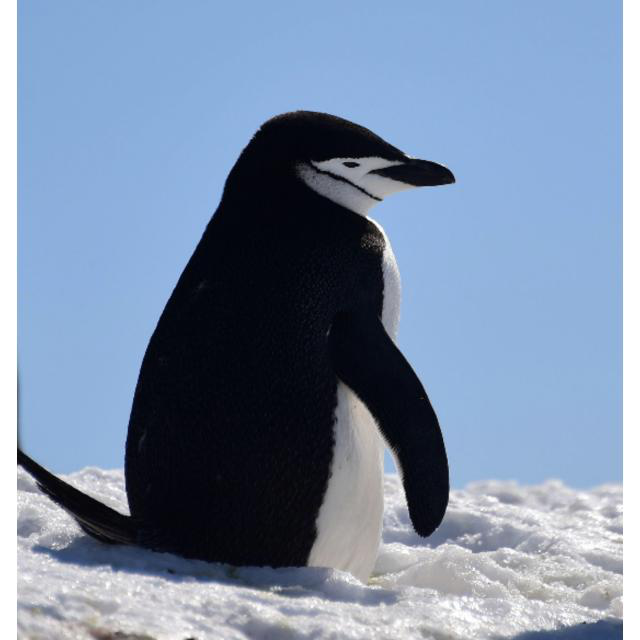

In [101]:
# Exibindo uma imagem do modelo de treino
PIL.Image.open("/content/drive/MyDrive/MLPenguins_Turts/train/train/image_id_005.jpg")

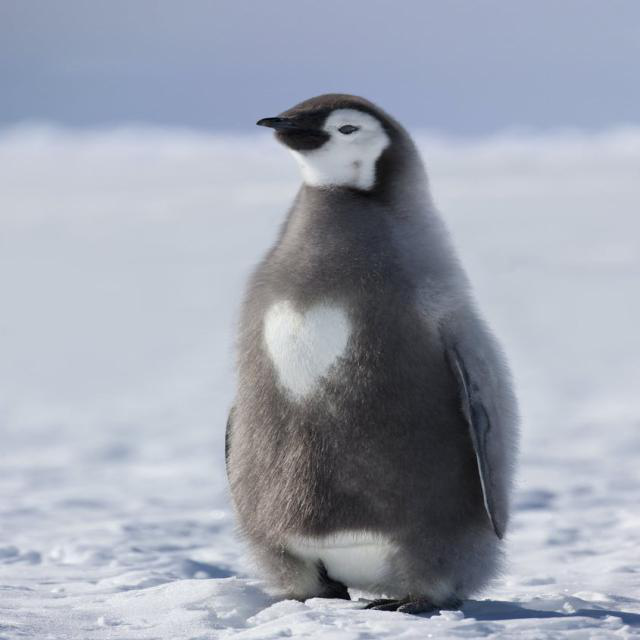

In [102]:
# Exibindo uma imagem do modelo de validação
PIL.Image.open("/content/drive/MyDrive/MLPenguins_Turts/valid/valid/image_id_000.jpg")

In [103]:
# Varificando o balanceamento dos dados [Classification] no dataset
balance= list(train_model['Classification'].value_counts())
balance

[250, 250]

Penguin    250
Turtle     250
Name: Classification, dtype: int64


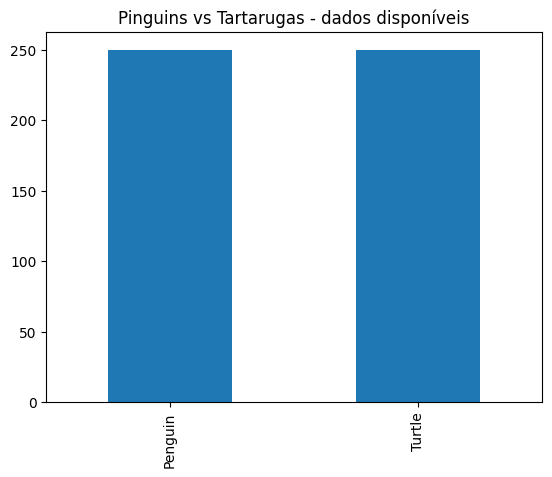

In [104]:
# Visualização do número de imagens por classe
print((train_model['Classification']).value_counts())
penguinVSturtle_count = train_model['Classification'].value_counts().plot.bar(title='Pinguins vs Tartarugas - dados disponíveis')

# Machine Learning

Iremos realizar o split do dataset de treino. A divisão dos dados em treino e teste: 30% das imagens para teste e 70% para treinamento do modelo de deep learning. Importante lembrar que os conjuntos devem ser disjuntos, ou seja, não devem poussir nenhum elemento em comum.

In [105]:
# Holdout com estratificação
train_df, test_df =train_test_split(train_df[['id_images' , 'Classification']] ,test_size=0.3 ,random_state=42 , shuffle=True, stratify=train_model['Classification'])

In [106]:
# Exibindo quantidade de dados
print ('Tamanho do nosso treino(train): ', len(train_df), ' Tamanho do nosso teste(test):: ', len(test_df), '  Tamanho da nossa validação(valid_model): ', len(val_df))

Tamanho do nosso treino(train):  350  Tamanho do nosso teste(test)::  150   Tamanho da nossa validação(valid_model):  72


In [107]:
#Visualizando a divisão dos dados treino X teste
print("##### Train: #####")
print(train_df)
print("##### Test: #####")
print(test_df)

##### Train: #####
                                             id_images Classification
408  /content/drive/MyDrive/MLPenguins_Turts/train/...         Turtle
202  /content/drive/MyDrive/MLPenguins_Turts/train/...        Penguin
405  /content/drive/MyDrive/MLPenguins_Turts/train/...        Penguin
36   /content/drive/MyDrive/MLPenguins_Turts/train/...        Penguin
45   /content/drive/MyDrive/MLPenguins_Turts/train/...        Penguin
..                                                 ...            ...
112  /content/drive/MyDrive/MLPenguins_Turts/train/...        Penguin
11   /content/drive/MyDrive/MLPenguins_Turts/train/...         Turtle
175  /content/drive/MyDrive/MLPenguins_Turts/train/...         Turtle
441  /content/drive/MyDrive/MLPenguins_Turts/train/...        Penguin
452  /content/drive/MyDrive/MLPenguins_Turts/train/...        Penguin

[350 rows x 2 columns]
##### Test: #####
                                             id_images Classification
317  /content/drive/MyDrive/M

# Preparação dos dados



**ImageDataGenerator** é uma classe utilitária fornecida pelo TensorFlow para aumentar e pré-processar dados de imagens. É comumente usada em tarefas de deep learning, especialmente para classificação de imagens, para gerar imagens aumentadas (data augmentation) sob demanda durante o treinamento do modelo.

Utilizamos ainda o **ImageDataGenerator** para separar um conjunto de validação com 20% das amostras do conjunto de treino. É importante que o conjunto de validação não contenha as imagens de teste, tendo em vista que elas não deveriam ser conhecidas no momento do treinamento.

Veja que neste caso é usado o método **flow_from_dataframe()** para gerar imagens aumentadas a partir de um dataframe que aponta para as imagens originais. O método recebe parâmetros como o dataframe, o diretório com as imagens, o tamanho do lote (batch size) e o modo de classe (neste caso, binário porque são apenas duas classes), entre outros.

Importante ressaltar que o pré-processamento do teste não evolve o aumento de dados.

In [108]:
train_datagen=ImageDataGenerator(validation_split=0.2, #conjunto de validação com 20% das amostras do conjunto de treino
                                 rescale = 1.0/255,
                                 rotation_range=40,
                                 shear_range=0.2,
                                 zoom_range=0.2,
                                 horizontal_flip=True,
                                 fill_mode='nearest')

test_datagen=ImageDataGenerator(rescale=1./255)

gen=ImageDataGenerator() # generator for validation and test

train_generator=train_datagen.flow_from_dataframe(
    train_df,
    target_size=(150,150),
    batch_size=50,
    seed=13,
    class_mode='binary',
    x_col='id_images',
    y_col='Classification',
    subset='training' # Treino
    )

val_generator=train_datagen.flow_from_dataframe(
    val_df,
    target_size=(150,150),
    batch_size=50,
    seed=13,
    class_mode='binary',
    x_col='id_images',
    y_col='Classification',
    subset='validation' # Validação
    )

test_generator=test_datagen.flow_from_dataframe(
    test_df,
    target_size=(150,150),
    batch_size=50,
    seed=13,
    class_mode='binary',
    x_col='id_images',
    y_col='Classification' # Teste
    )





Found 280 validated image filenames belonging to 2 classes.
Found 14 validated image filenames belonging to 2 classes.
Found 150 validated image filenames belonging to 2 classes.


Found 1 validated image filenames belonging to 1 classes.


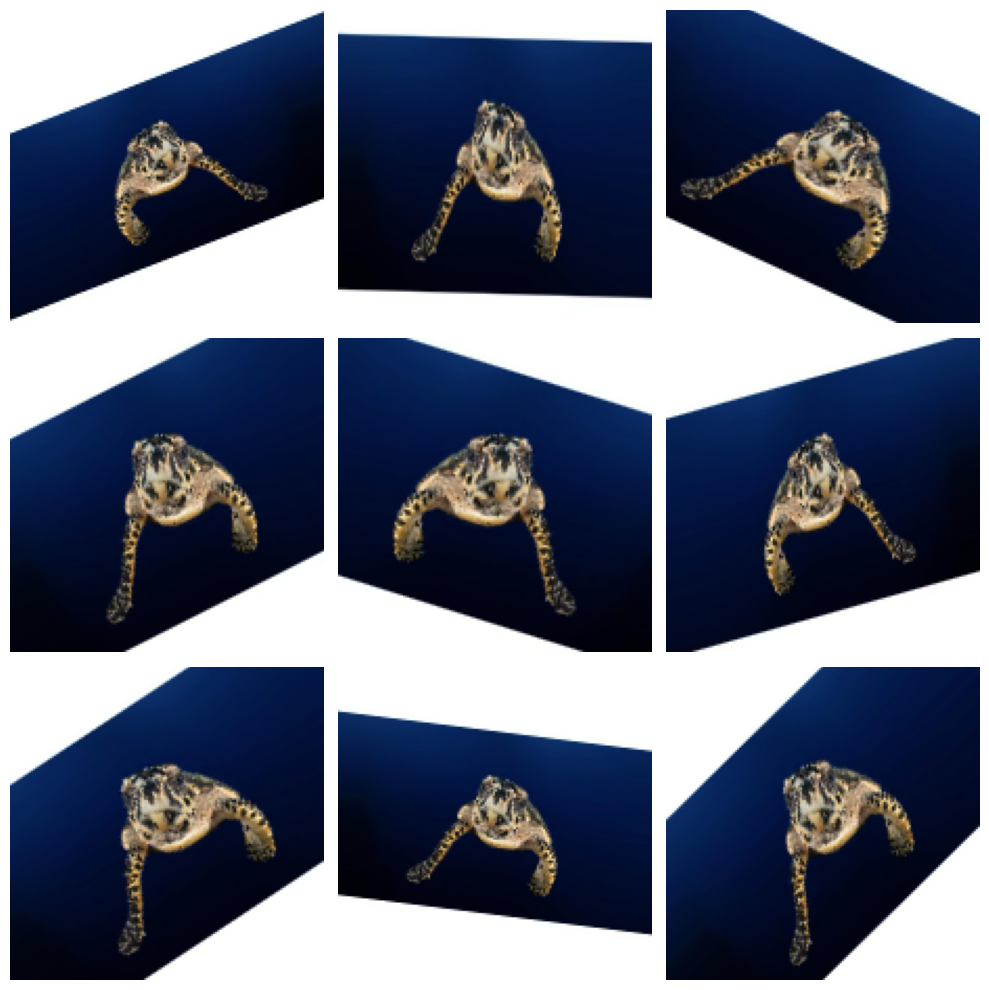

In [109]:
# Pegando um registro do dataframe de treino
sample = train_df.sample(n=1)

# Neste caso o tipo de classe é categorico, pois temos um exemplo com apenas uma classe
sample_generator = train_datagen.flow_from_dataframe(
    sample,
    x_col='id_images',
    y_col='Classification',
    target_size=(150,150),
    seed=13,
    class_mode='categorical'
)

# Exibindo as imagens
plt.figure(figsize=(10, 10))
for i in range(9):
    plt.subplot(3, 3, i+1)
    for x_batch, y_batch in sample_generator:
        image = x_batch[0]
        plt.imshow(image)
        plt.axis('Off')
        break
plt.tight_layout()
plt.show()

# Configuração de um modelo de deep learning usando uma rede neural convolucional (CNN) simples com a biblioteca Keras

**Definição da arquitetura do modelo**:
Aqui é especificada uma camada convolucional 2D que possui 32 filtros, um tamanho de filtro de 3x3 que usa a função de ativação ReLU. O parâmetro input_shape define a forma das imagens de entrada para a rede. Na sequência são adicionadas camadas max-pooling com a mesma função de ativação.

In [110]:
model=models.Sequential()
model.add(layers.Conv2D(32 ,(3,3) , activation='relu' , input_shape=(150,150,3 ) ) )
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(64 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

model.add(layers.Conv2D(128 , (3,3) , activation='relu'))
model.add(layers.MaxPooling2D( (2,2)))

In [111]:
model.add(layers.Flatten() )
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 512 ,activation='relu' ))
model.add(layers.Dropout(0.25))
model.add(layers.Dense( 1 , activation='sigmoid' ) )

O método `summary()` é usado para exibir um resumo da arquitetura do modelo de rede neural. Ele fornece uma representação compacta das camadas do modelo e seus parâmetros, incluindo o número de parâmetros treináveis e a forma de saída de cada camada.

In [112]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_8 (Conv2D)           (None, 148, 148, 32)      896       
                                                                 
 max_pooling2d_8 (MaxPooling  (None, 74, 74, 32)       0         
 2D)                                                             
                                                                 
 conv2d_9 (Conv2D)           (None, 72, 72, 64)        18496     
                                                                 
 max_pooling2d_9 (MaxPooling  (None, 36, 36, 64)       0         
 2D)                                                             
                                                                 
 conv2d_10 (Conv2D)          (None, 34, 34, 128)       73856     
                                                                 
 max_pooling2d_10 (MaxPoolin  (None, 17, 17, 128)     

#  Treinamento do modelo de deep learning

**Compilação do modelo Keras com as configurações do treinamento**

`optimizer='adam'`: especifica o otimizador a ser usado durante o treinamento.

`loss='binary_crossentropy'`: especifica a função de perda a ser usada durante o treinamento. Para problemas de classificação binária, onde a variável alvo tem apenas duas categorias, a perda binária de entropia cruzada é freqüentemente empregada.

`metrics=['accuracy']`: especifica as métricas de avaliação a serem usadas durante o treinamento e o teste.

In [113]:
model.compile(optimizer='adam', loss='binary_crossentropy' , metrics=['accuracy'])

O método `fit_generator()` inicia o processo de treinamento do modelo usando o gerador de dados para o treinamento `train_generator` e o gerador de dados de validação `val_generator.`

In [114]:
history=model.fit_generator(train_generator,
                            epochs=20,
                            verbose=1,
                            validation_data=val_generator,
                            validation_steps=None,
                            shuffle=True,
                            initial_epoch=0

)

<ipython-input-114-85097c44b7e6>:1: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  history=model.fit_generator(train_generator,


Epoch 1/20
6/6 [==============================] - 24s 4s/step - loss: 0.8148 - accuracy: 0.5107 - val_loss: 0.6960 - val_accuracy: 0.5000
Epoch 2/20
6/6 [==============================] - 22s 4s/step - loss: 0.6925 - accuracy: 0.5250 - val_loss: 0.6851 - val_accuracy: 0.5000
Epoch 3/20
6/6 [==============================] - 21s 3s/step - loss: 0.6933 - accuracy: 0.5429 - val_loss: 0.6836 - val_accuracy: 0.5000
Epoch 4/20
6/6 [==============================] - 22s 3s/step - loss: 0.6691 - accuracy: 0.6000 - val_loss: 0.6613 - val_accuracy: 0.5000
Epoch 5/20
6/6 [==============================] - 22s 3s/step - loss: 0.5924 - accuracy: 0.6643 - val_loss: 0.7655 - val_accuracy: 0.6429
Epoch 6/20
6/6 [==============================] - 20s 3s/step - loss: 0.5266 - accuracy: 0.7643 - val_loss: 0.6514 - val_accuracy: 0.7143
Epoch 7/20
6/6 [==============================] - 23s 3s/step - loss: 0.4844 - accuracy: 0.7714 - val_loss: 0.8625 - val_accuracy: 0.7143
Epoch 8/20
6/6 [==================

<function matplotlib.pyplot.show(close=None, block=None)>

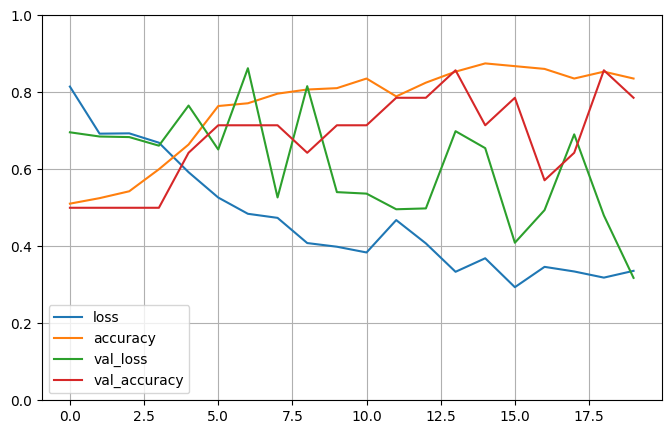

In [115]:
pd.DataFrame(history.history).plot(figsize=(8,5))
plt.grid(True)
plt.gca().set_ylim(0,1)
plt.show

# Execução do modelo treinado em um subconjunto das imagems de teste

2/2 [==============================] - 1s 231ms/step


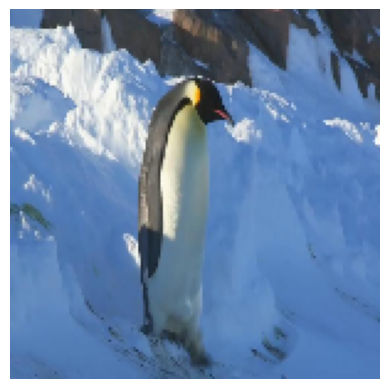

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.004267459


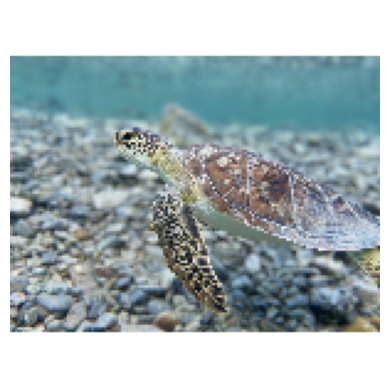

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.91806203


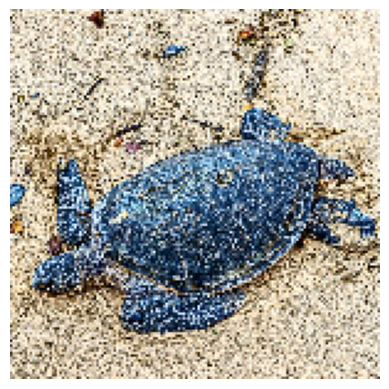

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9943993


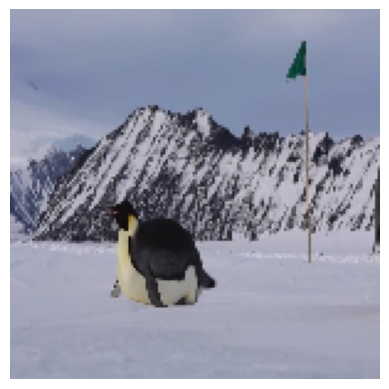

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.6336172


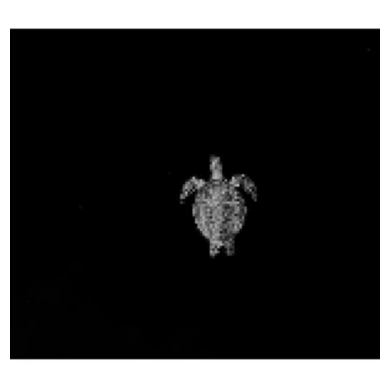

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.17600624


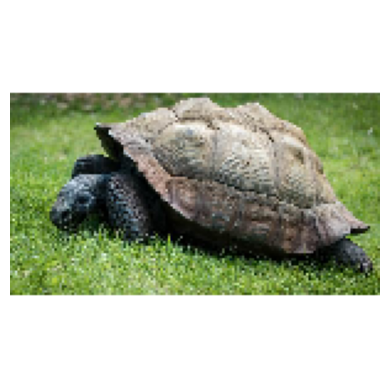

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9917477


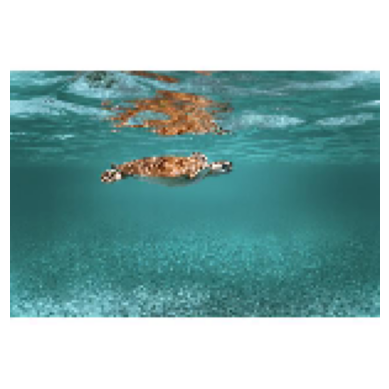

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.92617303


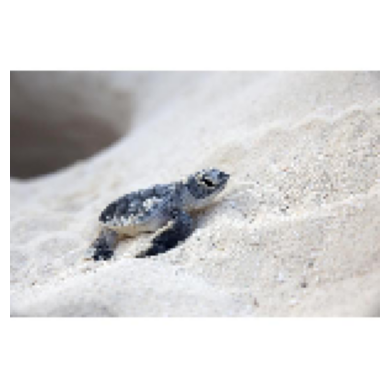

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.31484935


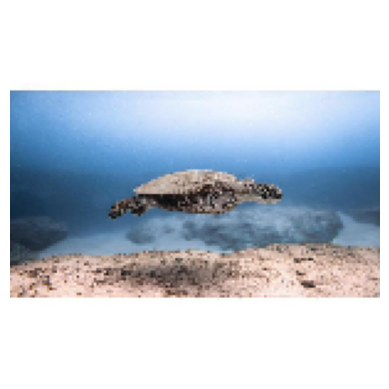

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.89509124


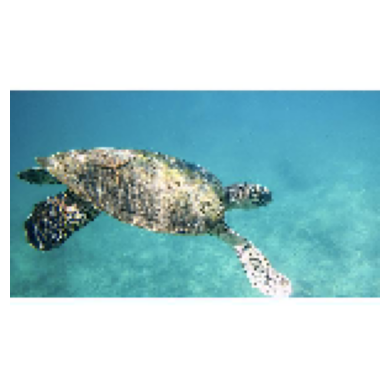

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9772549


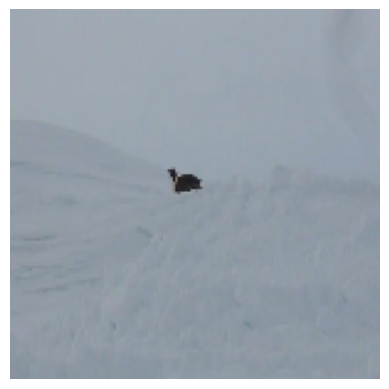

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.08773688


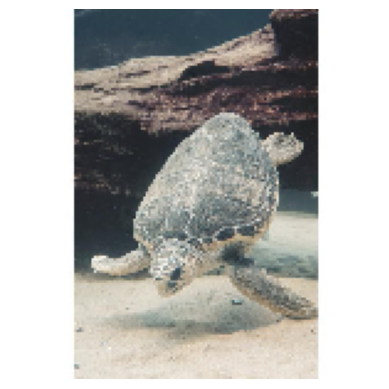

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.042450923


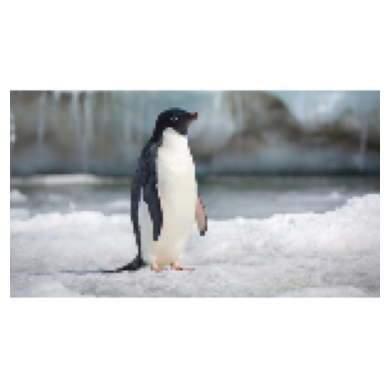

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0016232576


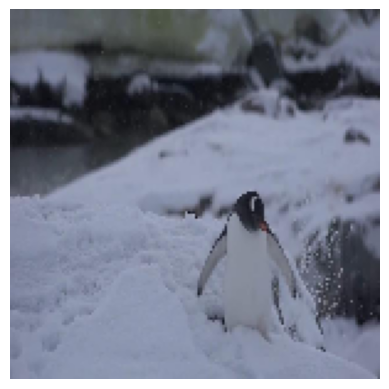

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.031842943


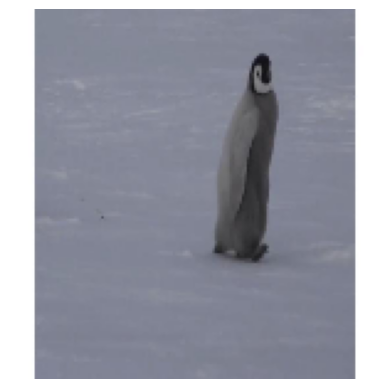

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.21410975


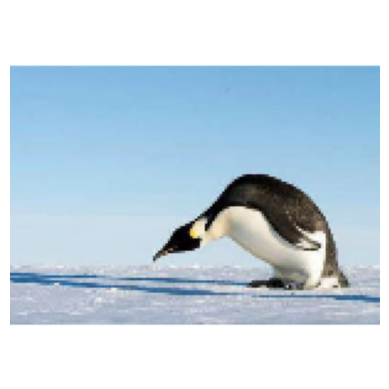

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.13655674


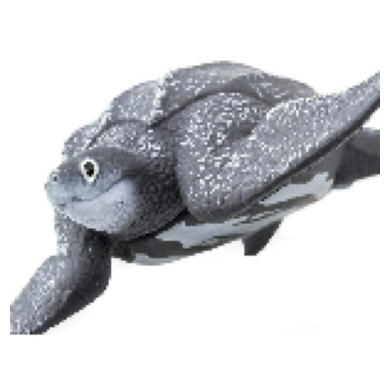

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9626075


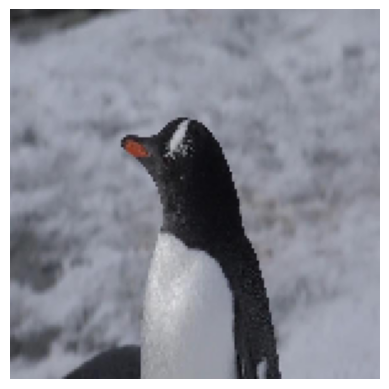

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0004059459


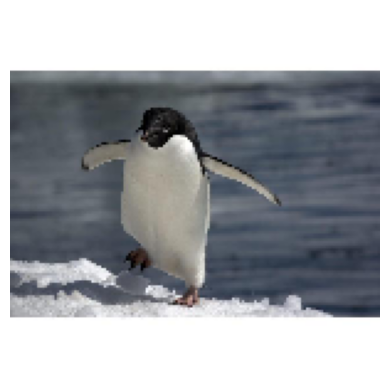

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.06278231


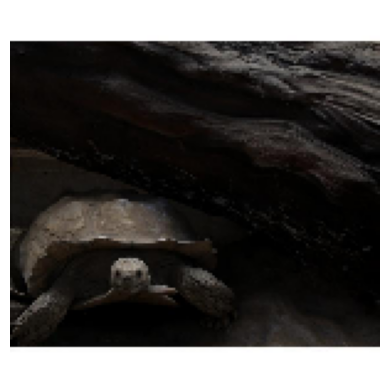

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9974414


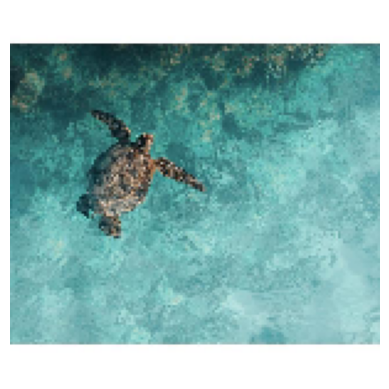

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.90190566


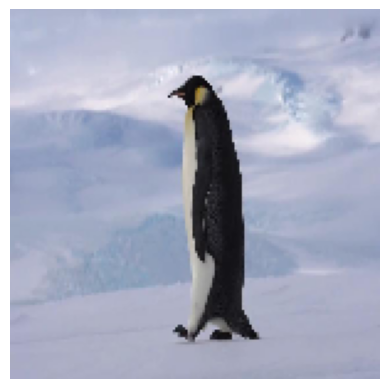

Label:  Penguin
Previsão:  Penguin
Probabilidade:  5.7405163e-05


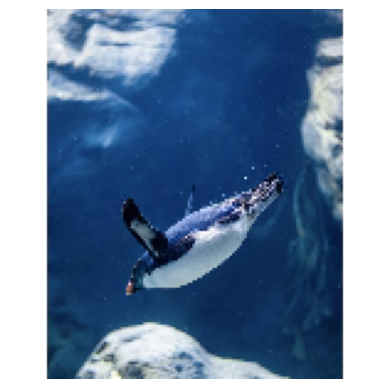

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.92745036


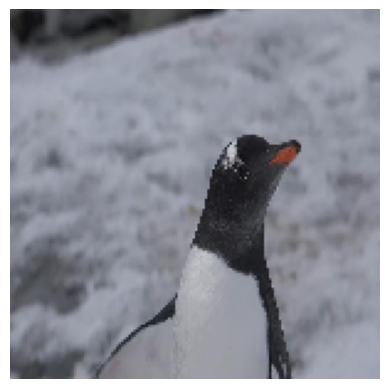

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.12779965


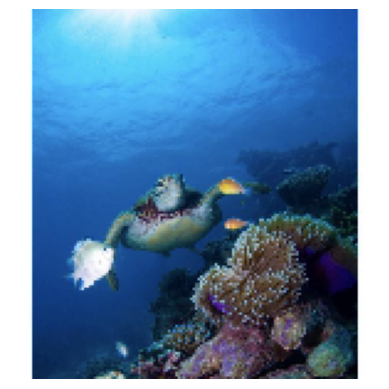

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.82558143


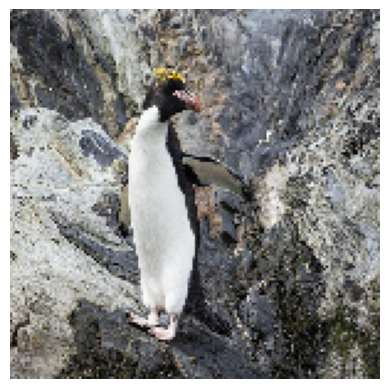

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0037397402


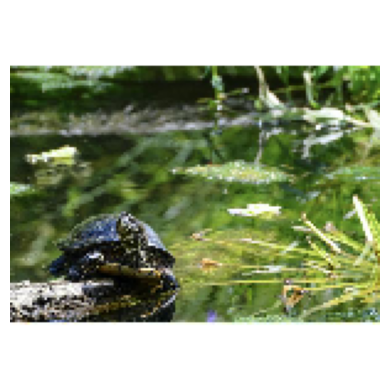

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99582285


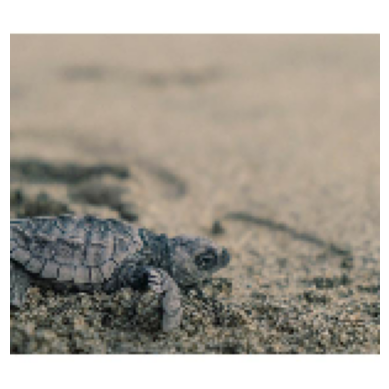

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.3856024


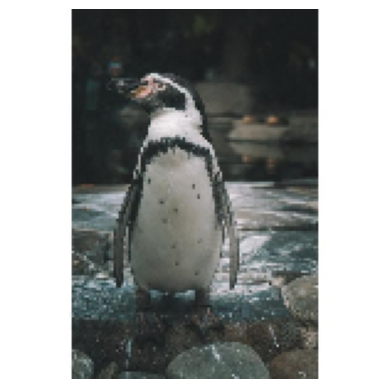

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.08632128


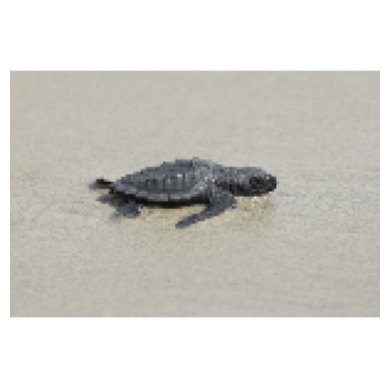

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.75866824


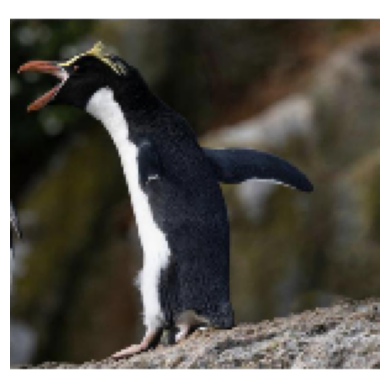

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0039716735


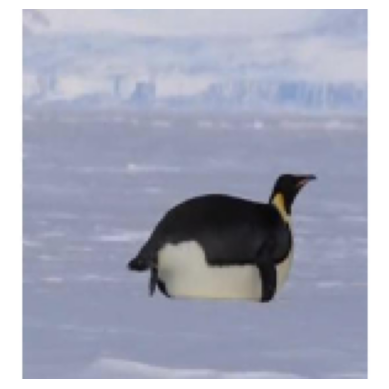

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.19451907


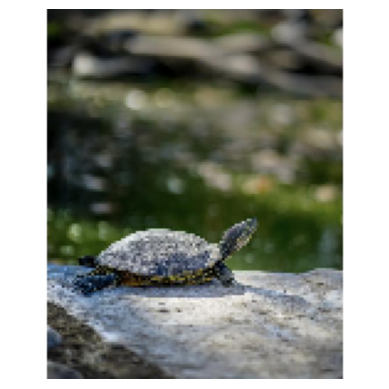

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9849587


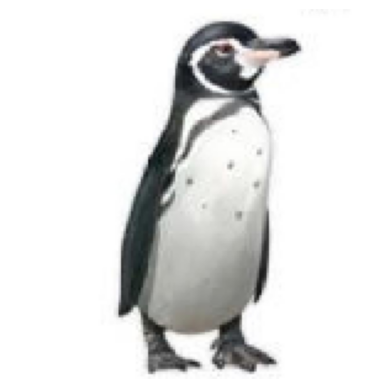

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0008921964


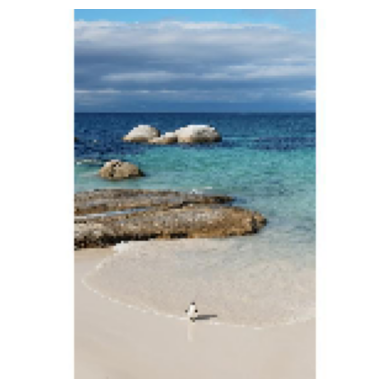

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.8839461


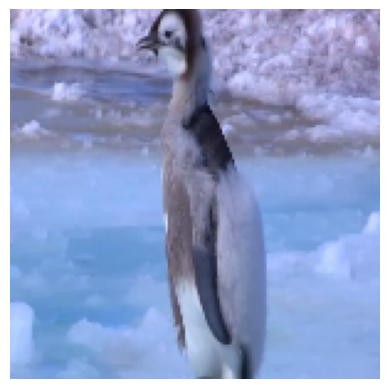

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.008106031


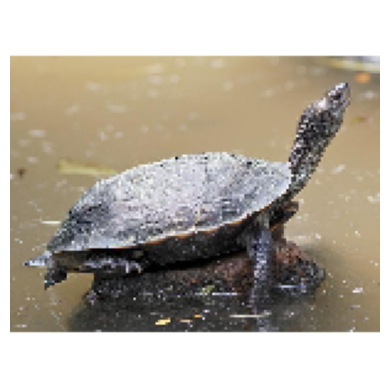

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9346351


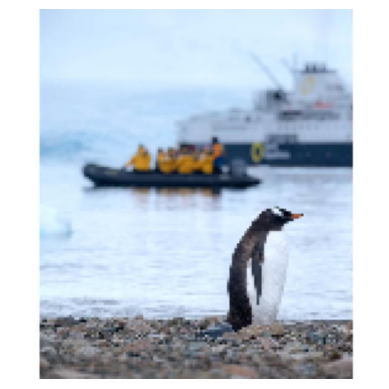

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.10977968


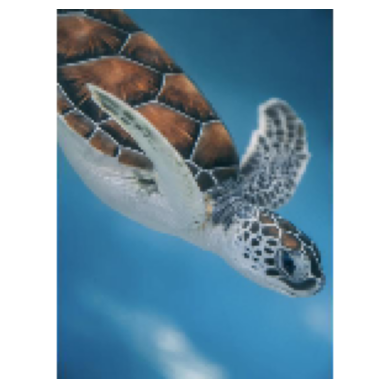

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.23824671


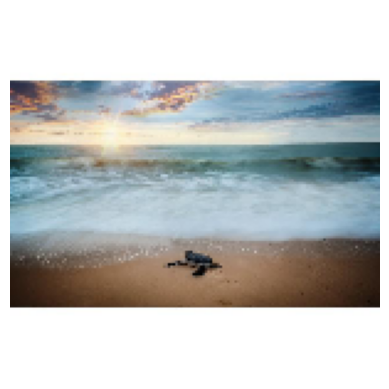

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.5260915


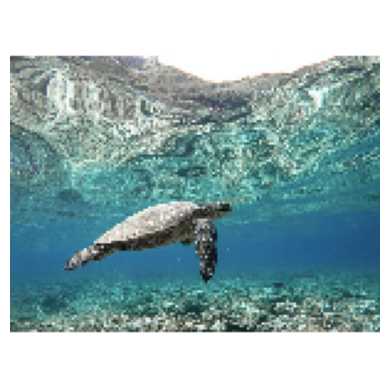

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9162078


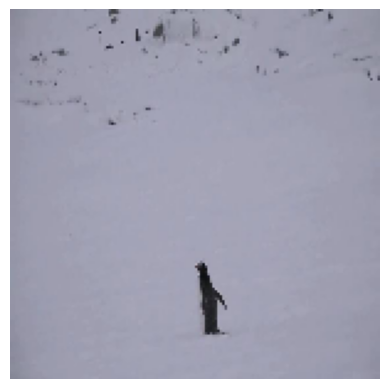

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.07322616


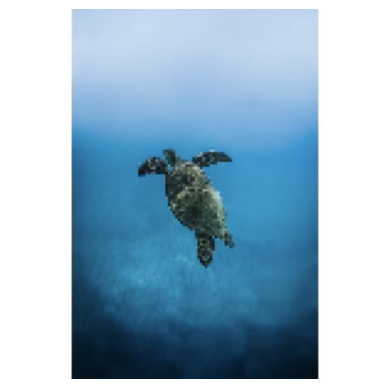

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.95635486


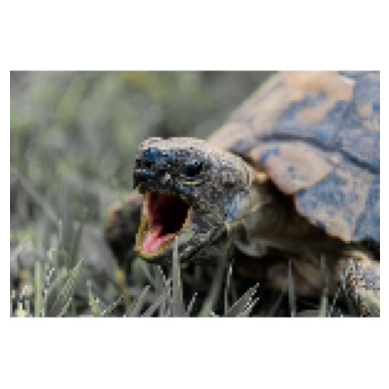

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9108541


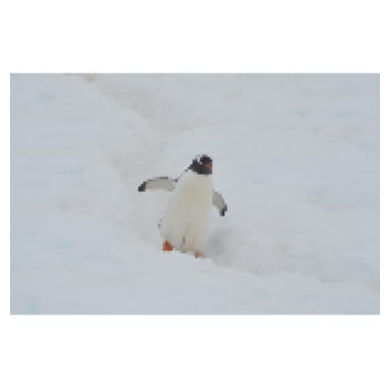

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.18178493


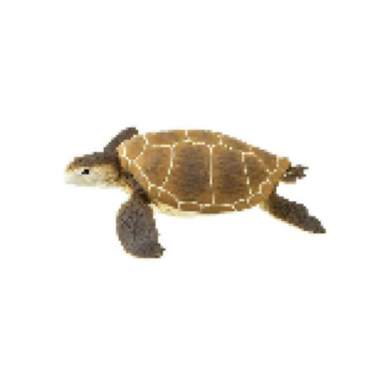

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.8360198


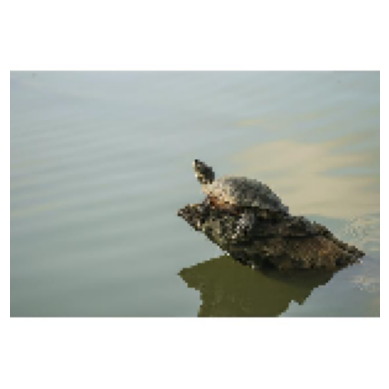

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.8617191


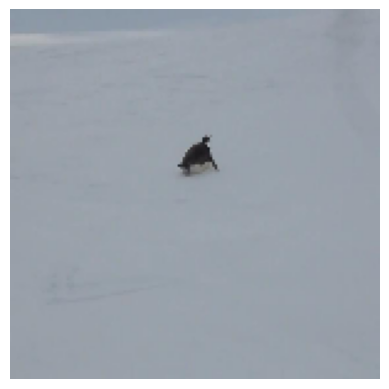

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.053314693


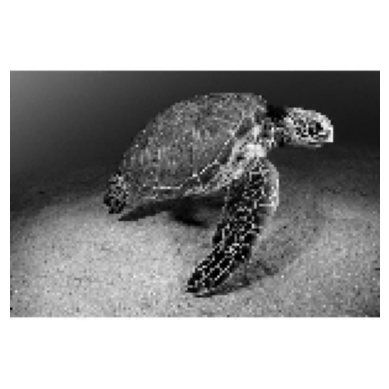

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99667686


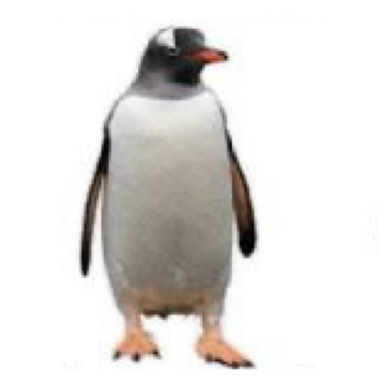

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.005109932


In [116]:
count = 0
y_pred = list()
y_true = list()
class_names = ['Penguin', 'Turtle']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Turtle' if prediction >= 0.5 else 'Penguin'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)

## Avaliação do modelo de deep learning

Acurácia do modelo nos dados de teste 82%

In [117]:
loss, accuracy = model.evaluate_generator(test_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-117-78954c843b8c>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(test_generator)


Test: accuracy = 0.820000  ;  loss = 0.411742 


Acurácia do modelo nos dados de validação

In [118]:
loss, accuracy = model.evaluate_generator(val_generator)
print("Test: accuracy = %f  ;  loss = %f " % (accuracy, loss))

<ipython-input-118-596b50fdfe64>:1: UserWarning: `Model.evaluate_generator` is deprecated and will be removed in a future version. Please use `Model.evaluate`, which supports generators.
  loss, accuracy = model.evaluate_generator(val_generator)


Test: accuracy = 0.714286  ;  loss = 0.512685 


### Visualização de métricas da avaliação do modelo

Métricas de performance do modelo no subconjunto das imagens de teste

In [119]:
accuracy = skm.accuracy_score(y_true, y_pred)
precision = skm.precision_score(y_true, y_pred, average='weighted')
recall = skm.recall_score(y_true, y_pred, average='weighted')
f1score = skm.f1_score(y_true, y_pred, average='weighted')

print("Accuracy: ", accuracy)
print("Precision: ", precision)
print("Recall: ", recall)
print("F1 Score: ", f1score)

Accuracy:  0.84
Precision:  0.8426923076923077
Recall:  0.84
F1 Score:  0.8400000000000002


## Exportação do modelo de deep learning para posterior uso

In [151]:
# obtendo a data e hora atual
now = datetime.now()

# Definição do formato
format = '%Y-%m-%dT%H%M'

# Converter a data e hora em uma string com o formato especificado
formatted_datetime = now.strftime(format)

path_model = 'datasets/penguins_vs_turtles/trained_models'

name_model = 'trained_model_' + formatted_datetime + '.h5'

# salvando o modelo
model.save("%s/%s" % (path_model, name_model))
print("Modelo salvo com o nome: ", name_model)

Modelo salvo com o nome:  trained_model_2023-07-18T0030.h5


# Teste do modelo exportado

In [152]:
# Carregando o modelo salvo
loaded_model = keras.models.load_model("%s/%s" % (path_model, name_model))
print("Modelo %s carregado com sucesso" % (name_model))

Modelo trained_model_2023-07-18T0030.h5 carregado com sucesso


2/2 [==============================] - 1s 229ms/step


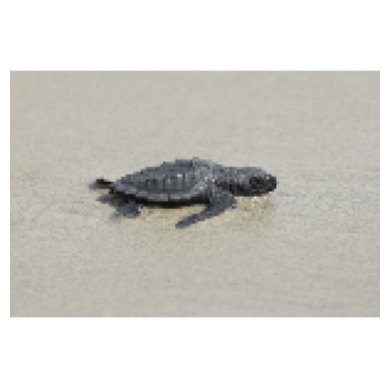

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.75866824


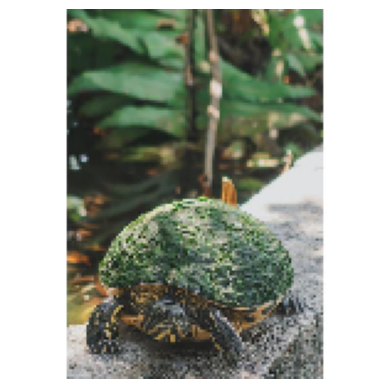

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.86901796


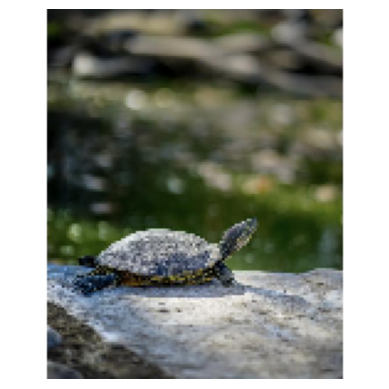

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9849587


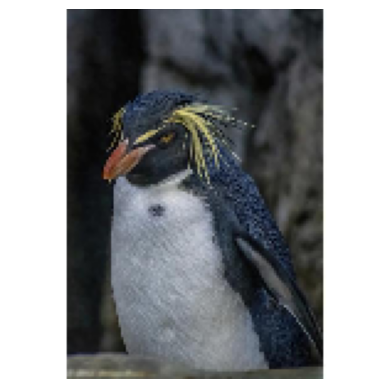

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.29134026


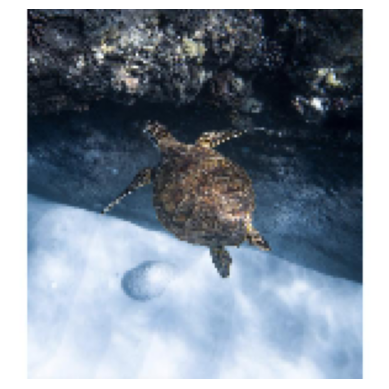

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.710862


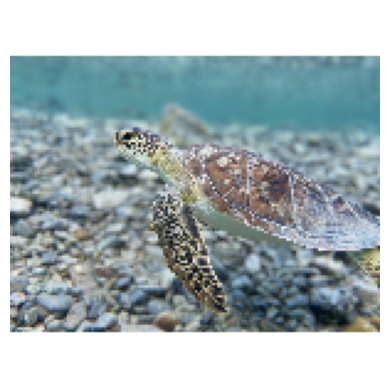

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.91806203


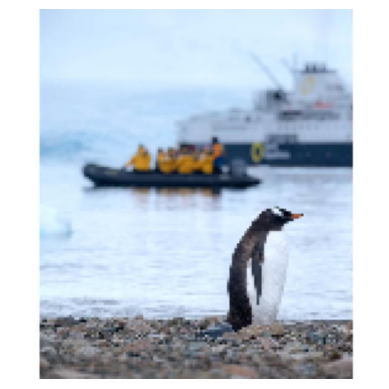

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.10977968


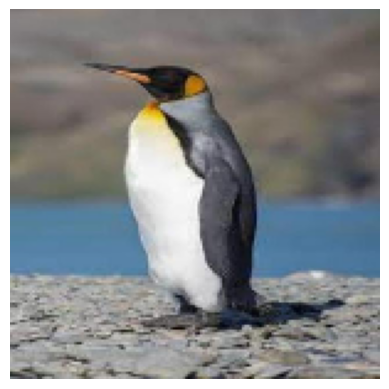

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0028619952


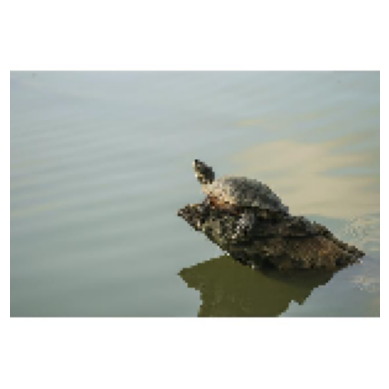

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.8617191


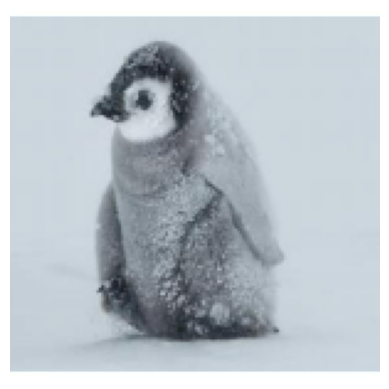

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.38071048


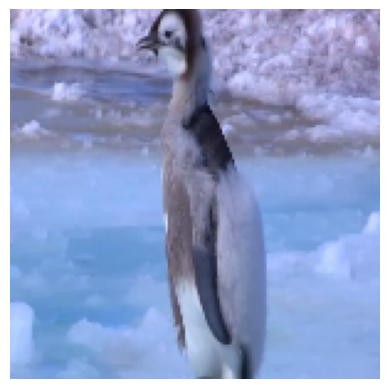

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.008106031


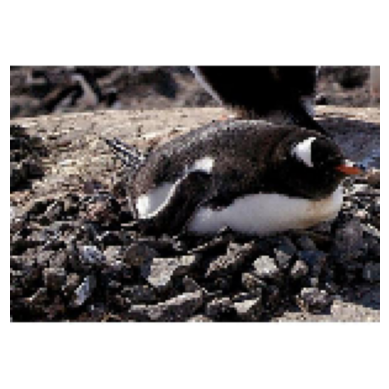

Label:  Penguin
Previsão:  Turtle
Probabilidade:  0.9972674


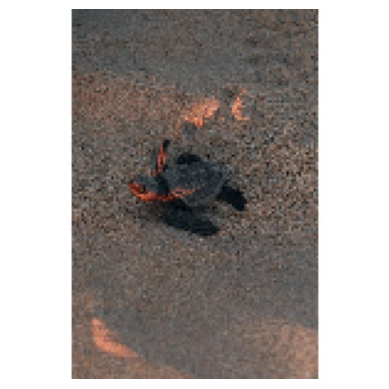

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9476655


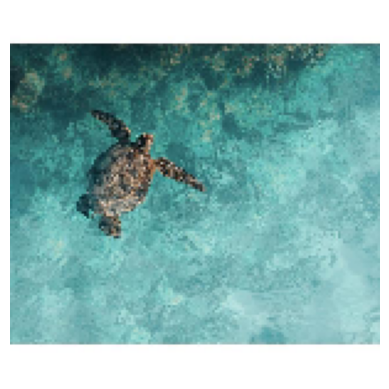

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.90190566


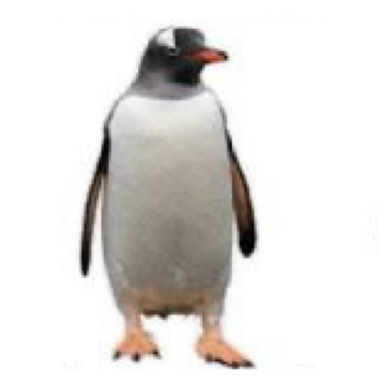

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.005109932


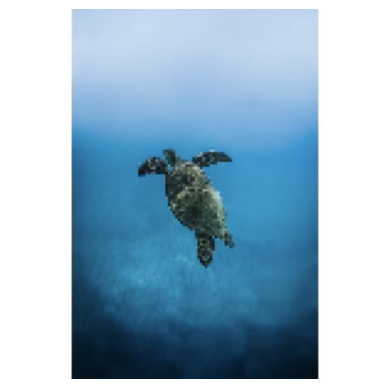

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.95635486


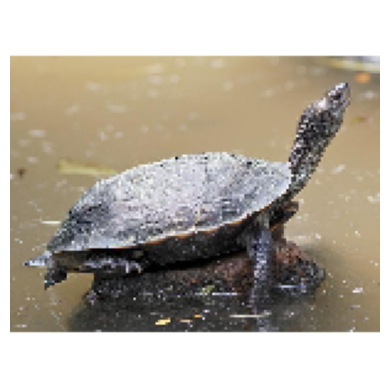

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9346351


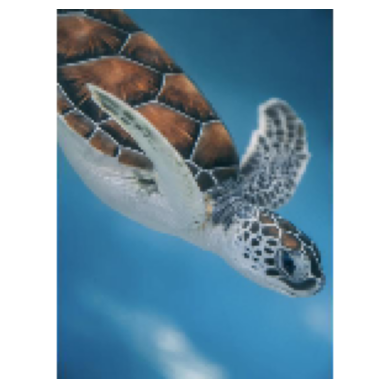

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.23824671


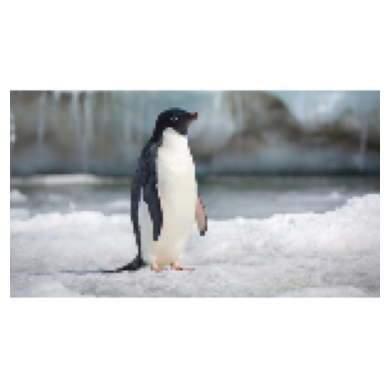

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0016232576


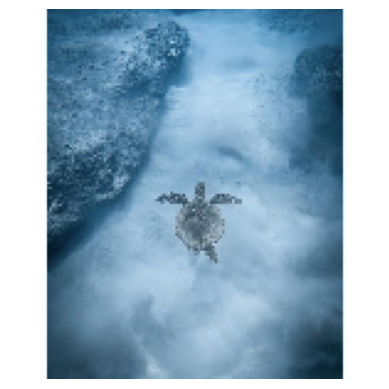

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.3977828


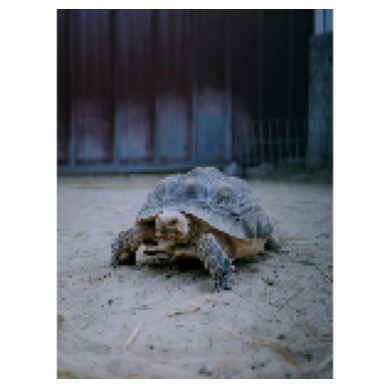

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.96823305


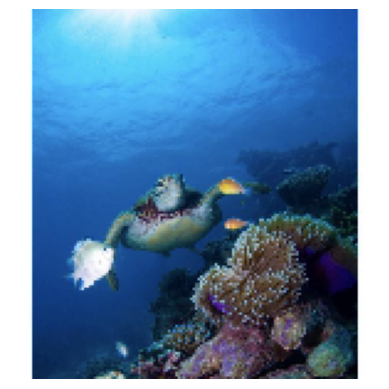

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.82558143


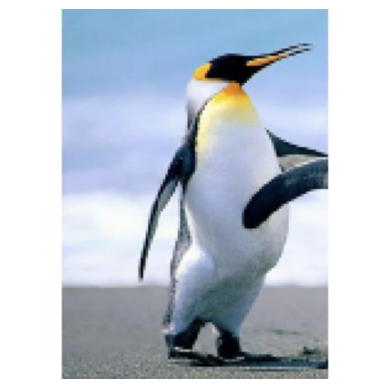

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.00011974258


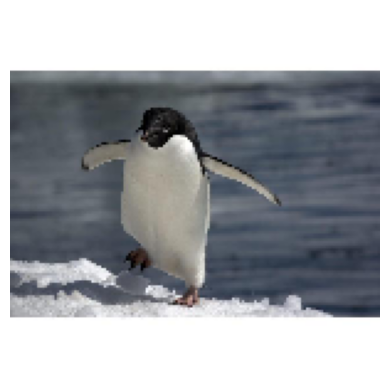

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.06278231


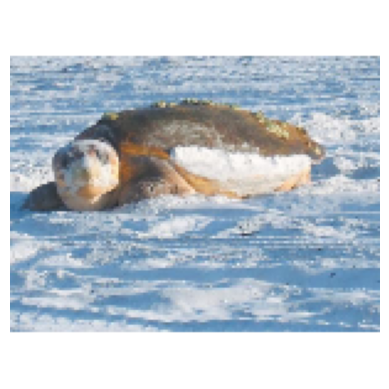

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.6195842


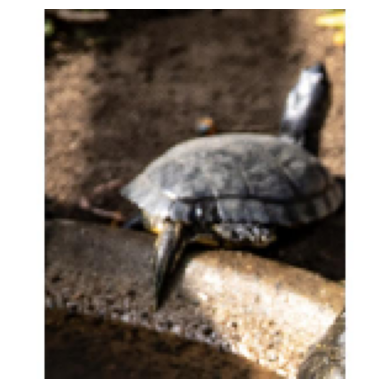

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.3461217


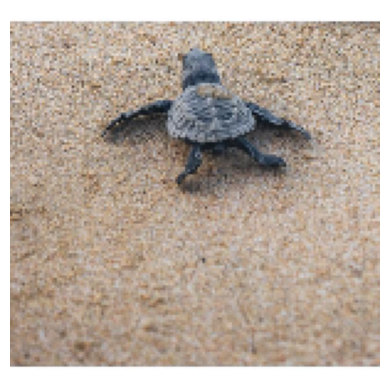

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.33205608


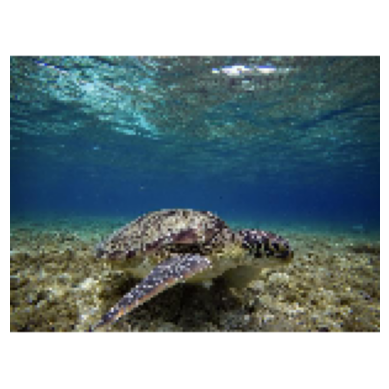

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9757839


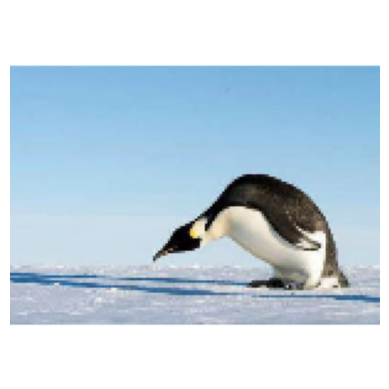

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.13655674


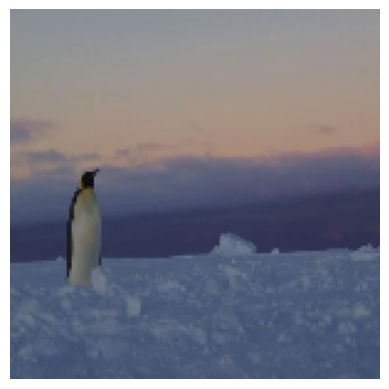

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.4198852


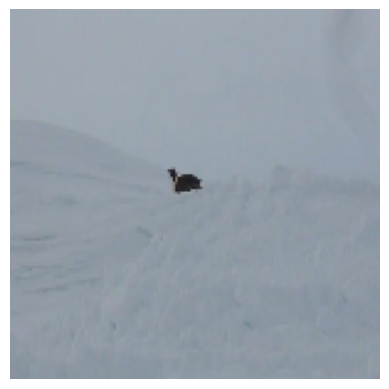

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.08773688


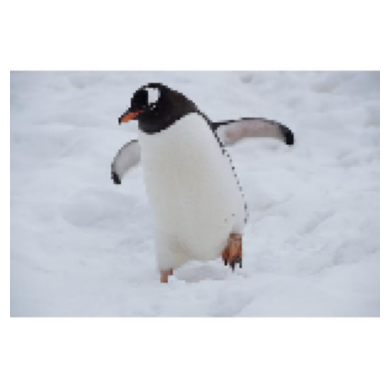

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.04496633


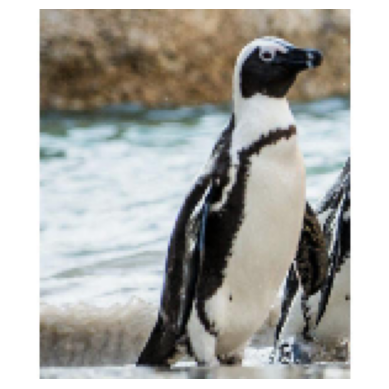

Label:  Penguin
Previsão:  Penguin
Probabilidade:  3.9165e-05


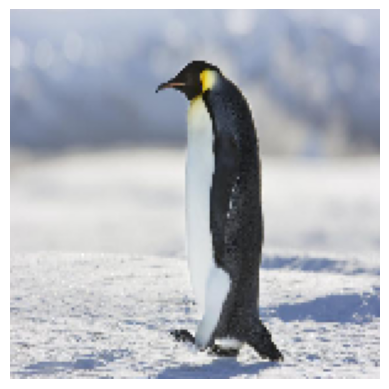

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.0008849018


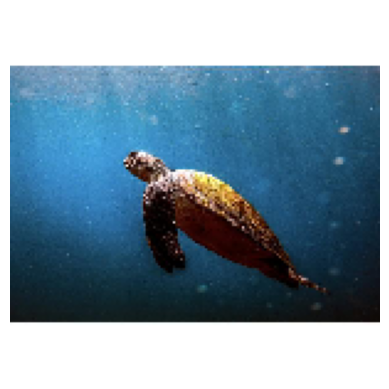

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9964471


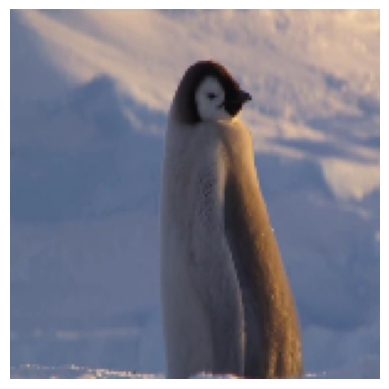

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.18597646


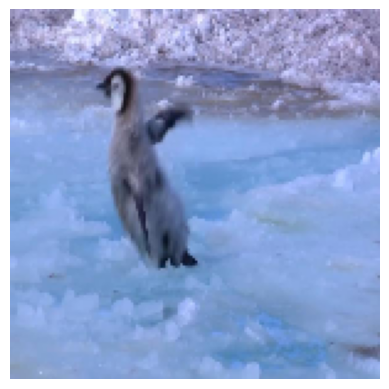

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.20085536


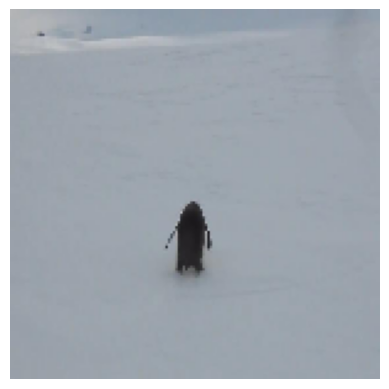

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.015137756


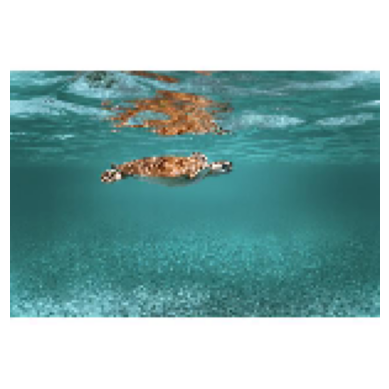

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.92617303


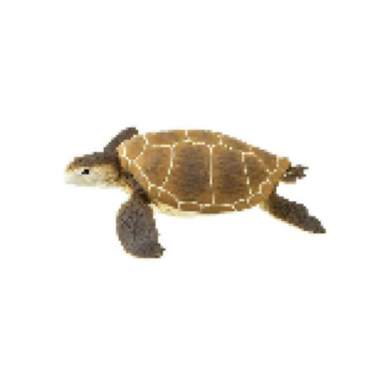

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.8360198


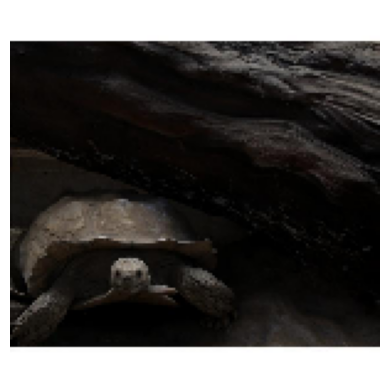

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9974414


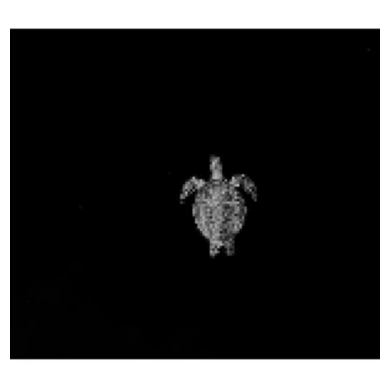

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.17600624


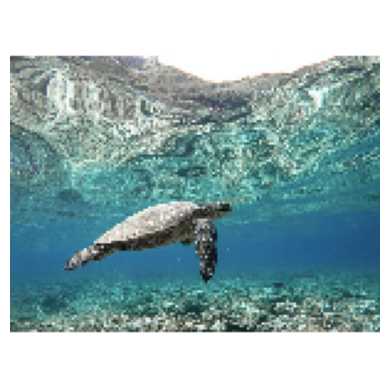

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9162078


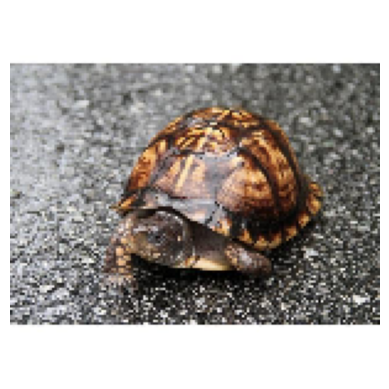

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.9806552


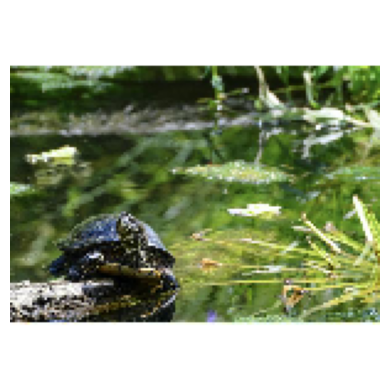

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99582285


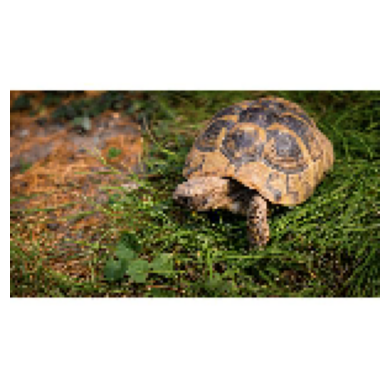

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.99932337


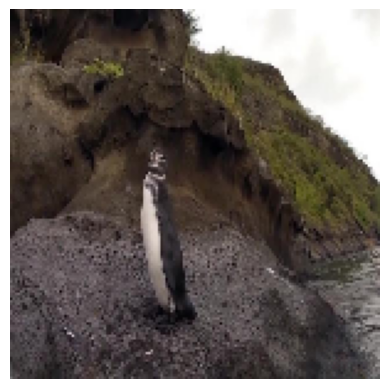

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.2065319


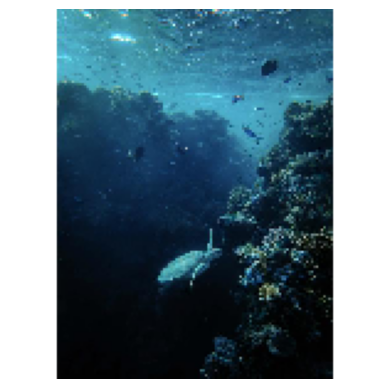

Label:  Turtle
Previsão:  Turtle
Probabilidade:  0.96292824


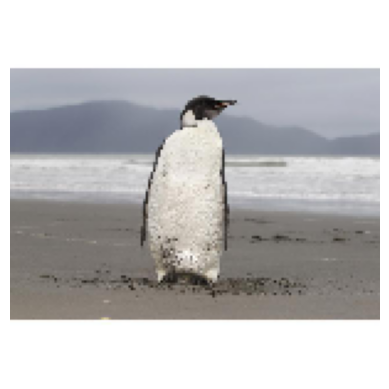

Label:  Penguin
Previsão:  Penguin
Probabilidade:  0.32503754


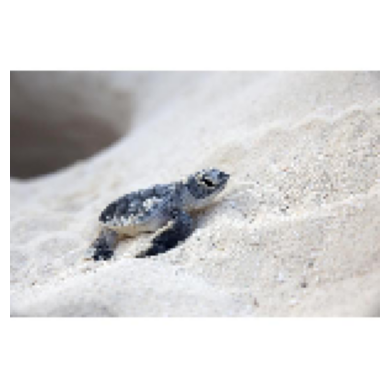

Label:  Turtle
Previsão:  Penguin
Probabilidade:  0.31484935


In [154]:
# Execução do modelo em um subconjunto de imagens de teste

count = 0
y_pred = list()
y_true = list()
class_names = ['Penguin', 'Turtle']

# Loop do data generator de teste que contem as imagens
for batch in test_generator:

    count+=1

    # Condição de saída do loop. Só executaremos o modelo em algumas imagens
    if count == 2:
        break

    else:

        # Pegando a imagem e o label
        images = batch[0]
        labels = batch[1]

        # Previsão
        predictions = loaded_model.predict(images)

        # Visualização da imagem
        for i in range(len(images)):

            image = images[i]
            label = labels[i]
            prediction = predictions[i]

            # Converte o array de previsão para visualizar a classe e a probabilidade
            predicted_class = np.argmax(prediction)
            probability = prediction[predicted_class]
            label = class_names[int(label)]
            y_true.append(label)

            # Faz o DE-PARA da probabilidade com o tipo de classe da previsão
            class_name = 'Turtle' if prediction >= 0.5 else 'Penguin'
            y_pred.append(class_name)

            # Configura a saída das imagens que serão visualizadas
            plt.imshow(images[i])
            plt.axis('Off')
            plt.show()

            # Imprime os resultados da classificação das images
            print("Label: ", label)
            print("Previsão: ", class_name)
            print("Probabilidade: ", probability)